In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
def vertical_dog_groove_response(gray, *, sigma=2.0, delta=10, normalize=True):
    """
    Jeff-style vertical detector for horizontal grooves.

    Kernel in y:
        K(y) = G(y,0,sigma) - 0.5*G(y, +delta, sigma) - 0.5*G(y, -delta, sigma)

    - Flat background ~ 0
    - Groove-like structure returns a strong signed response
    """
    # 1D y grid
    half = int(max(3, np.ceil(3*sigma + delta)))
    y = np.arange(-half, half+1, dtype=np.float32)

    def G(mu):
        return np.exp(-0.5*((y - mu)/sigma)**2)

    ky = G(0.0) - 0.5*G(+delta) - 0.5*G(-delta)

    if normalize:
        ky -= ky.mean()
        ky /= (np.sum(np.abs(ky)) + 1e-8)

    # Apply as separable filter: y kernel, then a mild x blur to enforce horizontality
    resp = cv2.sepFilter2D(gray.astype(np.float32), ddepth=-1,
                          kernelX=np.array([1], np.float32),
                          kernelY=ky.astype(np.float32))

    # Smooth along x so response is less sensitive to speckle
    resp = cv2.GaussianBlur(resp, (31, 1), 0)

    # Convert to a positive “strength map”
    # Depending on whether grooves show up as positive or negative, take abs.
    strength = np.abs(resp)

    # Scale to 8-bit for thresholding
    strength_u8 = cv2.normalize(strength, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return strength_u8


In [10]:
## new with changing C to be more positive 
def mask_from_response(resp_u8, *, binarize="adaptive", open_len=180, close_len=260):
    if binarize == "adaptive":
        bw = cv2.adaptiveThreshold(
            resp_u8, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,
            101,   # bigger neighborhood
            5      # <-- IMPORTANT: was -2; make it + to be less strict
        )
    else:
        _, bw = cv2.threshold(resp_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # opening: reduce a bit so you don't erase faint middles
    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open_len, 3))
    bw_open = cv2.morphologyEx(bw, cv2.MORPH_OPEN, open_kernel)

    # closing: increase so you reconnect weak middles along x
    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close_len, 3))
    bw_clean = cv2.morphologyEx(bw_open, cv2.MORPH_CLOSE, close_kernel)

    return bw, bw_clean


In [11]:
def find_cut_bands_from_mask(mask, min_run=12, min_gap=18, min_row_sum=200):
    """
    Find horizontal bands (y-ranges) where the mask has lots of white pixels.
    Returns list of (y0, y1) inclusive bounds for each band.
    """
    # mask is 0/255; convert to 0/1 then sum across x
    row_sum = (mask > 0).sum(axis=1)

    bands = []
    in_band = False
    start = 0

    for y, s in enumerate(row_sum):
        if (s >= min_row_sum) and (not in_band):
            in_band = True
            start = y
        elif (s < min_row_sum) and in_band:
            end = y - 1
            if (end - start + 1) >= min_run:
                bands.append([start, end])
            in_band = False

    # close if ended inside a band
    if in_band:
        end = len(row_sum) - 1
        if (end - start + 1) >= min_run:
            bands.append([start, end])

    # merge bands separated by small gaps (multiple ridges within one physical cut)
    merged = []
    for b in bands:
        if not merged:
            merged.append(b)
        else:
            if b[0] - merged[-1][1] <= min_gap:
                merged[-1][1] = b[1]
            else:
                merged.append(b)

    return [(b[0], b[1]) for b in merged]


In [12]:
def merge_bands_by_x_overlap(mask, bands, gap_tol=80, overlap_frac=0.6):
    """
    Merge adjacent bands if they are close in y AND their x support overlaps strongly.
    """
    if not bands:
        return []

    def x_extent(y0, y1):
        band = mask[y0:y1+1, :]
        ys, xs = np.where(band > 0)
        if len(xs) == 0:
            return None
        return int(xs.min()), int(xs.max())

    merged = [list(bands[0])]
    for (y0, y1) in bands[1:]:
        prev_y0, prev_y1 = merged[-1]
        if y0 - prev_y1 > gap_tol:
            merged.append([y0, y1])
            continue

        prev_ext = x_extent(prev_y0, prev_y1)
        cur_ext  = x_extent(y0, y1)
        if (prev_ext is None) or (cur_ext is None):
            merged.append([y0, y1])
            continue

        px1, px2 = prev_ext
        cx1, cx2 = cur_ext

        # overlap length / smaller length
        overlap = max(0, min(px2, cx2) - max(px1, cx1))
        denom = max(1, min(px2 - px1, cx2 - cx1))
        frac = overlap / denom

        if frac >= overlap_frac:
            merged[-1][1] = y1   # merge
        else:
            merged.append([y0, y1])

    return [(a, b) for a, b in merged]



In [13]:
def measure_cuts_from_bands_mask_energy_debug(
    gate, bands, *,
    fov_width_mm, image_width_px,
    pad_y=8, min_width_px=800,
    energy_frac=0.955,
    smooth_px=31,
    gap_fill_px=220,
):
    mm_per_px = fov_width_mm / image_width_px
    cuts = []
    debug = []   # one entry per band

    gate01 = (gate > 0).astype(np.uint8)
    H, W = gate01.shape

    k = max(3, smooth_px | 1)
    kernel = np.ones(k, dtype=np.float32) / k

    for bi, (y0, y1) in enumerate(bands):
        ya = max(0, y0 - pad_y)
        yb = min(H, y1 + pad_y)
        roi = gate01[ya:yb, :]

        prof = roi.sum(axis=0).astype(np.float32)
        prof_s = np.convolve(prof, kernel, mode="same")

        total = float(prof_s.sum())
        entry = {
            "band_index": bi,
            "band": (y0, y1),
            "ya_yb": (ya, yb),
            "total_energy": total,
            "raw_nonzero_cols": int(np.count_nonzero(prof)),
            "smoothed_nonzero_cols": int(np.count_nonzero(prof_s)),
            "kept": False,
            "drop_reason": None,
            "x1": None, "x2": None, "length_px": None
        }

        if total <= 0:
            entry["drop_reason"] = "no_energy"
            debug.append(entry)
            continue

        # fill small gaps in x support
        support = (prof_s > 0).astype(np.uint8)
        if gap_fill_px and gap_fill_px > 1:
            support = cv2.dilate(
                support.reshape(1, -1),
                cv2.getStructuringElement(cv2.MORPH_RECT, (gap_fill_px, 1)),
                iterations=1
            ).ravel()
            prof_use = prof_s * support
        else:
            prof_use = prof_s

        total_use = float(prof_use.sum())
        if total_use <= 0:
            entry["drop_reason"] = "no_energy_after_gapfill"
            debug.append(entry)
            continue

        cdf = np.cumsum(prof_use)
        left_idx  = int(np.searchsorted(cdf, (1 - energy_frac) * total_use))
        right_idx = int(np.searchsorted(cdf, energy_frac * total_use))

        x1 = int(np.clip(left_idx, 0, W - 1))
        x2 = int(np.clip(right_idx, 0, W - 1))
        length_px = float(max(0, x2 - x1))

        entry["x1"], entry["x2"], entry["length_px"] = x1, x2, length_px

        if length_px < min_width_px:
            entry["drop_reason"] = f"too_short(<{min_width_px})"
            debug.append(entry)
            continue

        y_mid = int((y0 + y1) / 2)
        cuts.append({
            "x1": x1, "y1": y_mid,
            "x2": x2, "y2": y_mid,
            "length_px": length_px,
            "length_mm": length_px * mm_per_px,
            "band": (y0, y1),
        })

        entry["kept"] = True
        debug.append(entry)

    return cuts, debug


In [23]:
image_path = "/Users/sanuma/git/mml_dinolite_vision/image_20260219_134709.png"
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# optional: CLAHE still helps
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_enh = clahe.apply(gray)

resp = vertical_dog_groove_response(gray_enh, sigma=2.0, delta=10)

bw_raw, bw_clean = mask_from_response(resp, binarize="adaptive",
                                      open_len=220, close_len=140)

# keep your band logic
bands = find_cut_bands_from_mask(bw_clean, min_run=10, min_gap=80, min_row_sum=150)
bands_merged = merge_bands_by_x_overlap(bw_clean, bands, gap_tol=80, overlap_frac=0.6)

# gate dilation: you can keep yours; for tougher images consider (241,5)
bw_gate = cv2.dilate(
    (bw_clean > 0).astype(np.uint8) * 255,
    cv2.getStructuringElement(cv2.MORPH_RECT, (241, 3)),
    iterations=1
)

cuts, dbg = measure_cuts_from_bands_mask_energy_debug(
    bw_gate, bands_merged,
    fov_width_mm=8.831,
    image_width_px=2048,
    pad_y=8,
    min_width_px=800,
    energy_frac=0.955,
    smooth_px=31,
    gap_fill_px=220
)


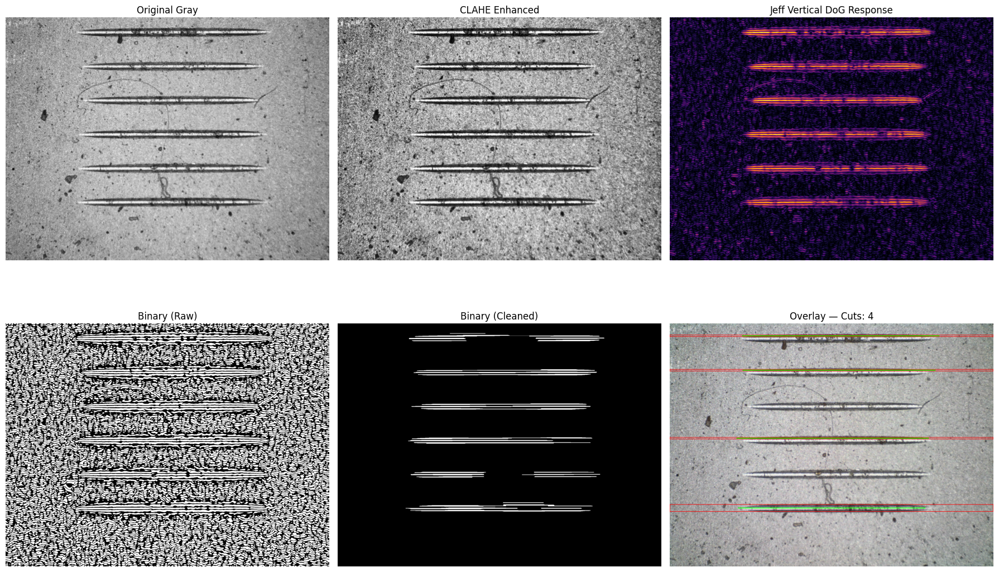

In [15]:
## visualize vertical gradient pipeline


# --- overlay visualization ---
img_color = cv2.imread(image_path)
rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
overlay = rgb.copy()

# draw band boxes
for (y0, y1) in bands_merged:
    cv2.rectangle(overlay, (0, y0), (overlay.shape[1]-1, y1), (255, 0, 0), 2)

# draw measured cuts
for c in cuts:
    cv2.line(overlay,
             (c["x1"], c["y1"]),
             (c["x2"], c["y2"]),
             (0, 255, 0),
             3)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1)
plt.imshow(gray, cmap="gray")
plt.title("Original Gray")
plt.axis("off")

plt.subplot(2,3,2)
plt.imshow(gray_enh, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(2,3,3)
plt.imshow(resp, cmap="inferno")
plt.title("Jeff Vertical DoG Response")
plt.axis("off")

plt.subplot(2,3,4)
plt.imshow(bw_raw, cmap="gray")
plt.title("Binary (Raw)")
plt.axis("off")

plt.subplot(2,3,5)
plt.imshow(bw_clean, cmap="gray")
plt.title("Binary (Cleaned)")
plt.axis("off")

plt.subplot(2,3,6)
plt.imshow(overlay)
plt.title(f"Overlay — Cuts: {len(cuts)}")
plt.axis("off")

plt.tight_layout()
plt.show()


Notes: the vertical gradient sees two bright lobes left and right with a weak middle and the logic in my code right (finding the bands in y + the min width pix for a line setting drops most of the lines and we end up with only 2 cuts it can find)

So what's next is:
1. treat the vertical gradient as our signal map
2. make a mask that keeps the whole groove including the weaker middle
3. then measure the x-extent and convert px to mm using the FOV

Some things i'm learning:
1.  in opencCV adaptive threshold, `THRESH_BINARY` uses `pixel > (local_mean - C)` where bigger `C` --> easier to become white and negative `C` --> harder to become white. Current value is set to `-2`. Let's try `+3` to `+7`

Rather than using `measure_cuts_from_bands_mask_energy`, we're going to use the vertical gradient response as "weights" to measure the x start and stop. See below:

In [16]:
def measure_cuts_from_bands_response_energy(
    resp_u8, bands, *,
    fov_width_mm, image_width_px,
    pad_y=8, min_width_px=800,
    energy_frac=0.955,
    smooth_px=31,
):
    mm_per_px = fov_width_mm / image_width_px
    H, W = resp_u8.shape
    cuts = []

    k = max(3, smooth_px | 1)
    kernel = np.ones(k, dtype=np.float32) / k

    resp = resp_u8.astype(np.float32)

    for (y0, y1) in bands:
        ya = max(0, y0 - pad_y)
        yb = min(H, y1 + pad_y)

        roi = resp[ya:yb, :]
        prof = roi.sum(axis=0)  # x-profile in "response energy"
        prof_s = np.convolve(prof, kernel, mode="same")

        total = prof_s.sum()
        if total <= 0:
            continue

        # OPTIONAL but recommended: stop endpoints from wandering into background
        # Keep only columns above a small fraction of the peak.
        peak = prof_s.max()
        prof_s = np.where(prof_s >= 0.08 * peak, prof_s, 0.0)  # 8% is a good start
        total = prof_s.sum()
        if total <= 0:
            continue

        cdf = np.cumsum(prof_s)
        left_idx  = int(np.searchsorted(cdf, (1 - energy_frac) * total))
        right_idx = int(np.searchsorted(cdf, energy_frac * total))

        x1 = int(np.clip(left_idx, 0, W - 1))
        x2 = int(np.clip(right_idx, 0, W - 1))
        length_px = float(max(0, x2 - x1))

        if length_px < min_width_px:
            continue

        y_mid = int((y0 + y1) / 2)
        cuts.append({
            "x1": x1, "y1": y_mid,
            "x2": x2, "y2": y_mid,
            "length_px": length_px,
            "length_mm": length_px * mm_per_px,
            "band": (y0, y1),
        })

    return cuts


#### Using above new measure with vertical gradient response coupled with `open_len = 180` and `close_len=260` instead of 220 and 140 respectively

In [17]:
image_path = "/Users/sanuma/git/mml_dinolite_vision/image_20260219_134709.png"
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# optional: CLAHE still helps
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_enh = clahe.apply(gray)

resp = vertical_dog_groove_response(gray_enh, sigma=2.0, delta=10)

bw_raw, bw_clean = mask_from_response(resp, binarize="adaptive",
                                      open_len=180, close_len=260)

# keep your band logic
bands = find_cut_bands_from_mask(bw_clean, min_run=10, min_gap=80, min_row_sum=150)
bands_merged = merge_bands_by_x_overlap(bw_clean, bands, gap_tol=80, overlap_frac=0.6)

# gate dilation: you can keep yours; for tougher images consider (241,5)
bw_gate = cv2.dilate(
    (bw_clean > 0).astype(np.uint8) * 255,
    cv2.getStructuringElement(cv2.MORPH_RECT, (241, 3)),
    iterations=1
)

cuts, dbg = measure_cuts_from_bands_mask_energy_debug(
    bw_gate, bands_merged,
    fov_width_mm=8.831,
    image_width_px=2048,
    pad_y=8,
    min_width_px=800,
    energy_frac=0.955,
    smooth_px=31,
    gap_fill_px=220
)


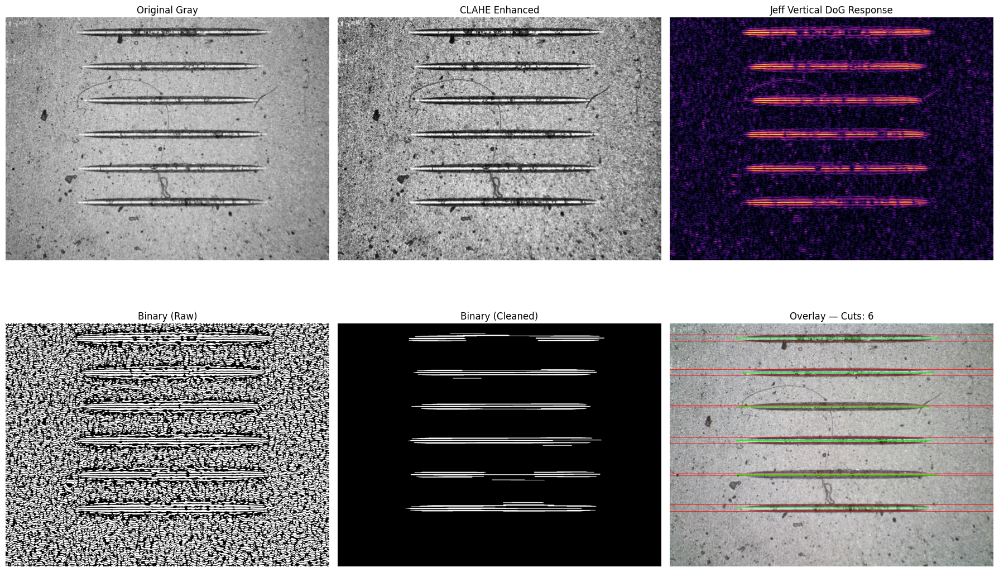

In [18]:
## visualize vertical gradient pipeline


# --- overlay visualization ---
img_color = cv2.imread(image_path)
rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
overlay = rgb.copy()

# draw band boxes
for (y0, y1) in bands_merged:
    cv2.rectangle(overlay, (0, y0), (overlay.shape[1]-1, y1), (255, 0, 0), 2)

# draw measured cuts
for c in cuts:
    cv2.line(overlay,
             (c["x1"], c["y1"]),
             (c["x2"], c["y2"]),
             (0, 255, 0),
             3)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1)
plt.imshow(gray, cmap="gray")
plt.title("Original Gray")
plt.axis("off")

plt.subplot(2,3,2)
plt.imshow(gray_enh, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(2,3,3)
plt.imshow(resp, cmap="inferno")
plt.title("Jeff Vertical DoG Response")
plt.axis("off")

plt.subplot(2,3,4)
plt.imshow(bw_raw, cmap="gray")
plt.title("Binary (Raw)")
plt.axis("off")

plt.subplot(2,3,5)
plt.imshow(bw_clean, cmap="gray")
plt.title("Binary (Cleaned)")
plt.axis("off")

plt.subplot(2,3,6)
plt.imshow(overlay)
plt.title(f"Overlay — Cuts: {len(cuts)}")
plt.axis("off")

plt.tight_layout()
plt.show()


In [19]:
# ---------- vertical gradient mask step (updated) ----------
def mask_from_response(resp_u8, *, binarize="adaptive", open_len=180, close_len=260):
    if binarize == "adaptive":
        bw = cv2.adaptiveThreshold(
            resp_u8, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,
            101,  # neighborhood (odd)
            5     # <-- less strict than -2; keeps the "middle" of the groove
        )
    else:
        _, bw = cv2.threshold(resp_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open_len, 3))
    bw_open = cv2.morphologyEx(bw, cv2.MORPH_OPEN, open_kernel)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close_len, 3))
    bw_clean = cv2.morphologyEx(bw_open, cv2.MORPH_CLOSE, close_kernel)

    return bw, bw_clean



Found 6 cuts
Cut 0: 1258.0 px  →  5.425 mm
Cut 1: 1168.0 px  →  5.036 mm
Cut 2: 1164.0 px  →  5.019 mm
Cut 3: 1187.0 px  →  5.118 mm
Cut 4: 1211.0 px  →  5.222 mm
Cut 5: 1173.0 px  →  5.058 mm


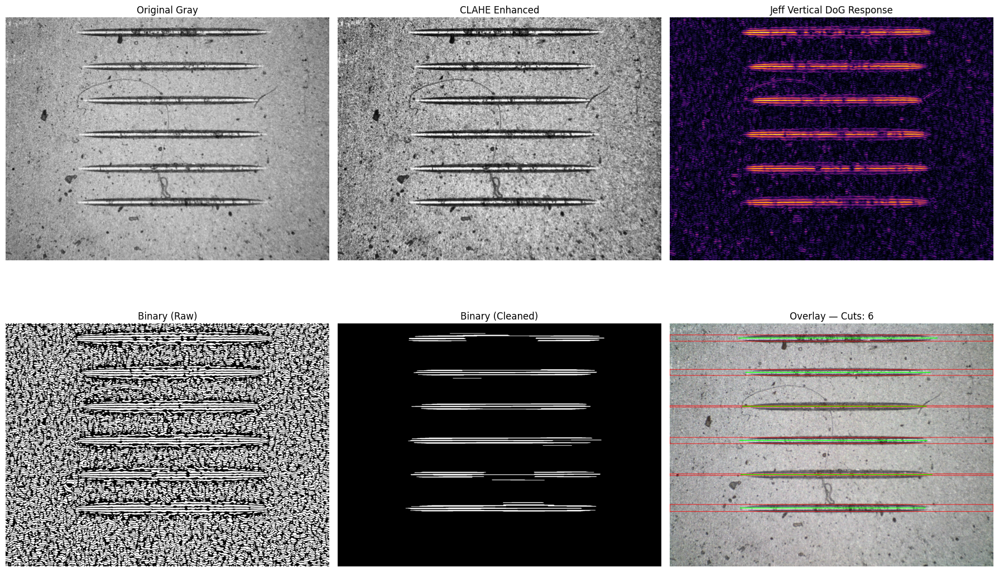

In [22]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ---------- Jeff mask step (updated) ----------
def mask_from_response(resp_u8, *, binarize="adaptive", open_len=180, close_len=260):
    if binarize == "adaptive":
        bw = cv2.adaptiveThreshold(
            resp_u8, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,
            101,  # neighborhood (odd)
            5     # <-- less strict than -2; keeps the "middle" of the groove
        )
    else:
        _, bw = cv2.threshold(resp_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open_len, 3))
    bw_open = cv2.morphologyEx(bw, cv2.MORPH_OPEN, open_kernel)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close_len, 3))
    bw_clean = cv2.morphologyEx(bw_open, cv2.MORPH_CLOSE, close_kernel)

    return bw, bw_clean


# ---------- Run pipeline ----------
image_path = "/Users/sanuma/git/mml_dinolite_vision/image_20260219_134709.png"

# Known calibration
FOV_WIDTH_MM = 8.831
IMAGE_WIDTH_PX = 2048

gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# CLAHE helps
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_enh = clahe.apply(gray)

# Jeff response
resp = vertical_dog_groove_response(gray_enh, sigma=2.0, delta=10)

# Mask from response
bw_raw, bw_clean = mask_from_response(resp, binarize="adaptive",
                                      open_len=180, close_len=260)

# Find bands from mask
bands = find_cut_bands_from_mask(
    bw_clean,
    min_run=10,
    min_gap=80,
    min_row_sum=150
)

bands_merged = merge_bands_by_x_overlap(
    bw_clean,
    bands,
    gap_tol=80,
    overlap_frac=0.6
)

# Gate dilation (widen x, tight y)
bw_gate = cv2.dilate(
    (bw_clean > 0).astype(np.uint8) * 255,
    cv2.getStructuringElement(cv2.MORPH_RECT, (241, 3)),
    iterations=1
)

# Measure
cuts, dbg = measure_cuts_from_bands_mask_energy_debug(
    bw_gate,
    bands_merged,
    fov_width_mm=FOV_WIDTH_MM,
    image_width_px=IMAGE_WIDTH_PX,
    pad_y=8,
    min_width_px=800,
    energy_frac=0.940,
    smooth_px=31,
    gap_fill_px=220
)

# Print results
print(f"Found {len(cuts)} cuts")
for i, c in enumerate(cuts):
    print(f"Cut {i}: {c['length_px']:.1f} px  →  {c['length_mm']:.3f} mm")

# Optional: print dropped bands + reason
dropped = [d for d in dbg if not d["kept"]]
if dropped:
    print("\nDropped bands:")
    for d in dropped:
        print(f"  band#{d['band_index']} {d['band']} reason={d['drop_reason']} len_px={d['length_px']}")

# ---------- Visualization ----------
img_color = cv2.imread(image_path)
rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
overlay = rgb.copy()

for (y0, y1) in bands_merged:
    cv2.rectangle(overlay, (0, y0), (overlay.shape[1]-1, y1), (255, 0, 0), 2)

for c in cuts:
    cv2.line(overlay, (c["x1"], c["y1"]), (c["x2"], c["y2"]), (0, 255, 0), 3)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1); plt.imshow(gray, cmap="gray"); plt.title("Original Gray"); plt.axis("off")
plt.subplot(2,3,2); plt.imshow(gray_enh, cmap="gray"); plt.title("CLAHE Enhanced"); plt.axis("off")
plt.subplot(2,3,3); plt.imshow(resp, cmap="inferno"); plt.title("Jeff Vertical DoG Response"); plt.axis("off")
plt.subplot(2,3,4); plt.imshow(bw_raw, cmap="gray"); plt.title("Binary (Raw)"); plt.axis("off")
plt.subplot(2,3,5); plt.imshow(bw_clean, cmap="gray"); plt.title("Binary (Cleaned)"); plt.axis("off")
plt.subplot(2,3,6); plt.imshow(overlay); plt.title(f"Overlay — Cuts: {len(cuts)}"); plt.axis("off")

plt.tight_layout()
plt.show()


#### Notes: oh! we've been doing gate dilation which is making the measured lengths longer on average! so let's remove gate dilation and see what happens below

Found 6 cuts
Cut 0: 1208.0 px  →  5.209 mm
Cut 1: 1122.0 px  →  4.838 mm
Cut 2: 1108.0 px  →  4.778 mm
Cut 3: 1170.0 px  →  5.045 mm
Cut 4: 1181.0 px  →  5.092 mm
Cut 5: 1158.0 px  →  4.993 mm


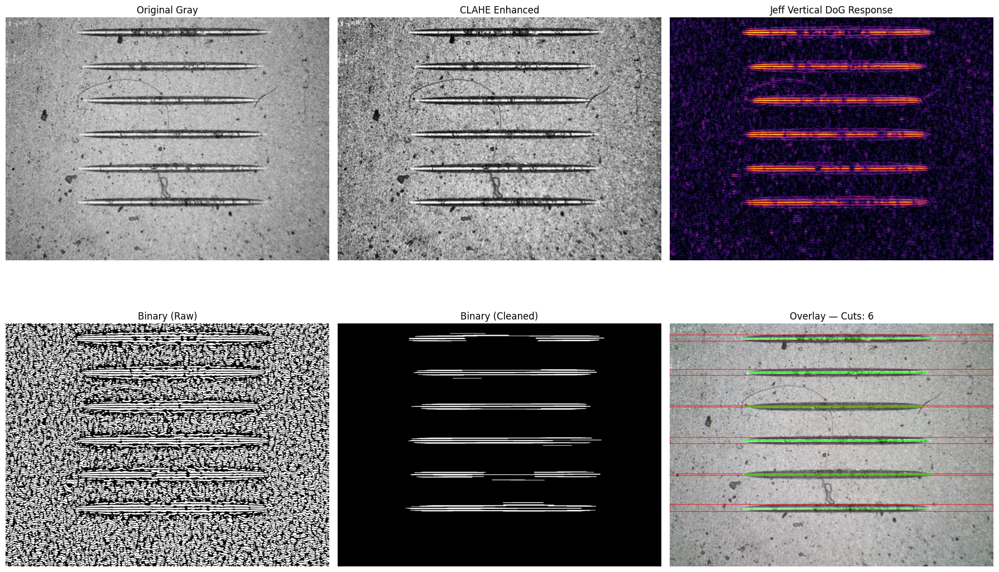

In [26]:
# ---------- Jeff mask step (updated) ----------
def mask_from_response(resp_u8, *, binarize="adaptive", open_len=180, close_len=260):
    if binarize == "adaptive":
        bw = cv2.adaptiveThreshold(
            resp_u8, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,
            101,  # neighborhood (odd)
            5     # <-- less strict than -2; keeps the "middle" of the groove
        )
    else:
        _, bw = cv2.threshold(resp_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    open_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (open_len, 3))
    bw_open = cv2.morphologyEx(bw, cv2.MORPH_OPEN, open_kernel)

    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (close_len, 3))
    bw_clean = cv2.morphologyEx(bw_open, cv2.MORPH_CLOSE, close_kernel)

    return bw, bw_clean


# ---------- Run pipeline ----------
image_path = "/Users/sanuma/git/mml_dinolite_vision/image_20260219_134709.png"

# Known calibration
FOV_WIDTH_MM = 8.831
IMAGE_WIDTH_PX = 2048

gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# CLAHE helps
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_enh = clahe.apply(gray)

# Jeff response
resp = vertical_dog_groove_response(gray_enh, sigma=2.0, delta=10)

# Mask from response
bw_raw, bw_clean = mask_from_response(resp, binarize="adaptive",
                                      open_len=180, close_len=260)

# Find bands from mask
bands = find_cut_bands_from_mask(
    bw_clean,
    min_run=10,
    min_gap=80,
    min_row_sum=150
)

bands_merged = merge_bands_by_x_overlap(
    bw_clean,
    bands,
    gap_tol=80,
    overlap_frac=0.6
)

# Gate dilation (widen x, tight y) --> NO, stop doing this
bw_gate = (bw_clean > 0).astype(np.uint8) * 255


# Measure
cuts, dbg = measure_cuts_from_bands_mask_energy_debug(
    bw_gate,
    bands_merged,
    fov_width_mm=FOV_WIDTH_MM,
    image_width_px=IMAGE_WIDTH_PX,
    pad_y=8,
    min_width_px=800,
    energy_frac=0.995,
    smooth_px=31,
    gap_fill_px=220
)

# Print results
print(f"Found {len(cuts)} cuts")
for i, c in enumerate(cuts):
    print(f"Cut {i}: {c['length_px']:.1f} px  →  {c['length_mm']:.3f} mm")

# Optional: print dropped bands + reason
dropped = [d for d in dbg if not d["kept"]]
if dropped:
    print("\nDropped bands:")
    for d in dropped:
        print(f"  band#{d['band_index']} {d['band']} reason={d['drop_reason']} len_px={d['length_px']}")

# ---------- Visualization ----------
img_color = cv2.imread(image_path)
rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
overlay = rgb.copy()

for (y0, y1) in bands_merged:
    cv2.rectangle(overlay, (0, y0), (overlay.shape[1]-1, y1), (255, 0, 0), 2)

for c in cuts:
    cv2.line(overlay, (c["x1"], c["y1"]), (c["x2"], c["y2"]), (0, 255, 0), 3)

plt.figure(figsize=(18,12))

plt.subplot(2,3,1); plt.imshow(gray, cmap="gray"); plt.title("Original Gray"); plt.axis("off")
plt.subplot(2,3,2); plt.imshow(gray_enh, cmap="gray"); plt.title("CLAHE Enhanced"); plt.axis("off")
plt.subplot(2,3,3); plt.imshow(resp, cmap="inferno"); plt.title("Jeff Vertical DoG Response"); plt.axis("off")
plt.subplot(2,3,4); plt.imshow(bw_raw, cmap="gray"); plt.title("Binary (Raw)"); plt.axis("off")
plt.subplot(2,3,5); plt.imshow(bw_clean, cmap="gray"); plt.title("Binary (Cleaned)"); plt.axis("off")
plt.subplot(2,3,6); plt.imshow(overlay); plt.title(f"Overlay — Cuts: {len(cuts)}"); plt.axis("off")

plt.tight_layout()
plt.show()


looks like removing gate dilation above and bringing energy_frac back down to 0.995 improved things really well

human raw measurements were: 
1. 5.3
2. 4.9
3. 4.8
4. 5.0
5. 5.2 (i question whether i measured this correctly)
6. 5.1


### To do tomorrow Feb 20 2026:
1. could also add some changes to the CDF (cumulative distribution function--> i.e., at what x does 95.5% of the total cut energy live?" and produces some percentile-based endpoints):
```
prof_s = np.convolve(prof, kernel, mode="same")
cdf = np.cumsum(prof_s)
left = searchsorted(cdf, (1-energy_frac)*total)
right = searchsorted(cdf, energy_frac*total)
```
will drift outwards if `prof_s` has low-amplitude tails beyond the true cut ends (from smoothing and image processing)

Fix: add a hard "tail cutoff" on `prof_s` before we build the CDF, based on a fraction of its peak? 

could add the following to `measure_cuts_from_bands_mask_energy` after smoothing:
```
peak = prof_s.max()
tau = 0.08 * peak        # start with 8%; tune 5–12%
prof_s = np.where(prof_s >= tau, prof_s, 0.0)
total = prof_s.sum()
if total <= 0:
    continue

```